# Noms : Christine ANTON (21108059) & Elise NICOLAS (21103771)

# TME 01 Estimation de densité

## Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import pandas as pd
from typing import *
from sklearn.model_selection import train_test_split

## Extraction des données

In [2]:
POI_FILENAME = "../data/poi-paris.pkl"
parismap = mpimg.imread('../data/paris-48.806-2.23--48.916-2.48.jpg')

# Coordonnées GPS de la carte
xmin, xmax = 2.23, 2.48  # coord_x min et max
ymin, ymax = 48.806, 48.916  # coord_y min et max
coords = [xmin, xmax, ymin, ymax]

## Fonctions Globales

In [3]:
def get_density2D(f, data, steps=100) :
    """ 
    Calcule la densité en chaque case d'une grille steps x steps dont les bornes sont calculées à partir du min/max de data. Renvoie la grille estimée et la discrétisation sur chaque axe.
    """
    xmin, xmax = data[:,0].min(), data[:,0].max()
    ymin, ymax = data[:,1].min(), data[:,1].max()
    xlin,ylin = np.linspace(xmin,xmax,steps), np.linspace(ymin,ymax,steps)
    xx, yy = np.meshgrid(xlin,ylin)
    grid = np.c_[xx.ravel(), yy.ravel()]
    res = f.predict(grid).reshape(steps, steps)
    return res, xlin, ylin


def show_density(f, data, steps=100, log=False) :
    """ 
    Dessine la densité f et ses courbes de niveau sur une grille 2D calculée à partir de data, avec un pas de discrétisation de steps. Le paramètre log permet d'afficher la log densité plutôt que la densité brute
    """
    res, xlin, ylin = get_density2D(f, data, steps)
    xx, yy = np.meshgrid(xlin, ylin)
    plt.figure()
    show_img()
    if log:
        res = np.log(res+1e-10)
    plt.scatter(data[:, 0], data[:, 1], alpha=0.8, s=3)
    show_img(res)
    plt.colorbar()
    plt.contour(xx, yy, res, 20)


def show_img(img=parismap) :
    """ 
    Affiche une matrice ou une image selon les coordonnées de la carte de Paris.
    """
    origin = "lower" if len(img.shape) == 2 else "upper"
    alpha = 0.3 if len(img.shape) == 2 else 1.
    plt.imshow(img, extent=coords, aspect=1.5, origin=origin, alpha=alpha)
    ## extent pour controler l'échelle du plan


def load_poi(typepoi, fn=POI_FILENAME) :
    """ 
    Dictionaire POI, clé : type de POI, valeur : dictionnaire des POIs de ce type : (id_POI, [coordonnées, note, nom, type, prix])
    
    Liste des POIs : furniture_store, laundry, bakery, cafe, home_goods_store, clothing_store, atm, lodging, night_club, convenience_store, restaurant, bar
    """
    poidata = pickle.load(open(fn, "rb"))
    data = np.array([[v[1][0][1], v[1][0][0]] for v in sorted(poidata[typepoi].items())])
    note = np.array([v[1][1] for v in sorted(poidata[typepoi].items())])
    return data, note

## Affichage des données

{'furniture_store': {'ChIJvQW3LzBu5kcR1K1RinPHWuo': ((48.86663159999999, 2.3316366), 2.2, 'Unopiu', ['furniture_store', 'home_goods_store', 'store', 'point_of_interest', 'establishment'], -1), 'ChIJPa034vBu5kcRgPhYMUxo0Dk': ((48.90328890000001, 2.339881399999999), -1, 'Olivier Hutzemakers', ['furniture_store', 'home_goods_store', 'store', 'point_of_interest', 'establishment'], -1), 'ChIJS2paJgVy5kcRsWnyhE-Ng4Y': ((48.84763299999999, 2.3753779), -1, 'Téodor', ['furniture_store', 'home_goods_store', 'store', 'point_of_interest', 'establishment'], -1), 'ChIJ5_Q5YZRv5kcRs3k9SIdrmtM': ((48.8798415, 2.2971538), 5, 'Féau and Co.', ['furniture_store', 'home_goods_store', 'store', 'point_of_interest', 'establishment'], -1), 'ChIJvw0d809w5kcRvg7fJrlayzE': ((48.8279332, 2.3090737), -1, 'Patoux Florence Marie-therese', ['furniture_store', 'home_goods_store', 'store', 'point_of_interest', 'establishment'], -1), 'ChIJ86G-5alt5kcRtPN69Wx3nsA': ((48.8890514, 2.4137347), 1, 'Au Salon Du Meuble', ['furn

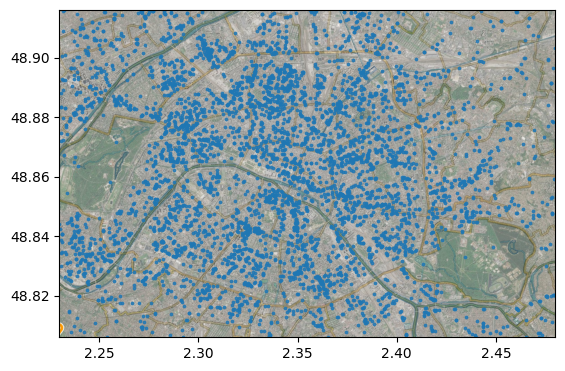

In [4]:
# Extraction des données
with open(POI_FILENAME, 'rb') as poi : 
    data=pickle.load(poi)
print(data)

plt.ion()

# Liste des POIs : furniture_store, laundry, bakery, cafe, home_goods_store, clothing_store, atm, lodging, night_club, convenience_store, restaurant, bar
# La fonction charge la localisation des POIs dans geo_mat et leur note.
geo_mat, notes = load_poi("bar")

# Affiche la carte de Paris
show_img()

# Affiche les POIs
plt.scatter(geo_mat[:,0],geo_mat[:,1],alpha=0.8,s=3)

## Classe Density

In [5]:
class Density(object):
    def fit(self, data):
        """
        Apprend un estimateur sur les données passées en argument
        """
        pass

    def predict(self, data):
        """
        Prédit la densité pour chaque point de données
        """
        pass

    def score(self, data):
        """
        Retourne la log-vraisemblance des données

        Parameters : 
            - self : Density object, instance de la classe Density
            - data : np.ndarray, coordonnées [x, y] de chaque point de données
        Returns : 
            - LL : float, log-vraisemblance des données
        """
        L = self.predict(data)
        L = np.where(L == 0, 1e-10, L)
        LL = np.log(L).sum()
        return LL

Ajouter une très petite valeur (ici, 1e-10) aux densités nulles permet d'éviter le calcul de log(0), qui n'est pas défini. Cela permet donc de réaliser le calcul du score (log-vraisemblance des données data) de l’estimateur sans problème.

## Méthode par histogramme

### Classe Histogramme

In [6]:
class Histogramme(Density):
    def __init__(self, steps=10):
        Density.__init__(self)
        self.steps = steps
        self.density = None
        self.edges = None

    def fit(self, x):
        """
        Apprend l'histogramme de densité sur x

        Parameters : 
            - x : np.ndarray, coordonnées [x, y] de chaque point de données
        Returns : 
            - d : np.ndarray de taille (steps,steps), densités de x
        """
        self.density, self.edges = np.histogramdd(x, bins=[self.steps]*x.shape[-1], density=True)
        return self.density
        
    def predict(self, x):
        """
        Retourne la densité estimée pour chaque point de x

        Parameters : 
            - x : np.ndarray, coordonnées [x, y] de chaque point de données
        Returns : 
            - pred : np.ndarray de taille (steps,steps), densités estimées de x
        """
        def to_bin(x):
            """
            Associe chaque point de x à un bin dans l'histogramme

            Parameters :
                - x : np.ndarray, coordonnées [x, y] de chaque point de données

            Returns :
                - indices : List[Tuple[int, int]], indices des bins associés aux points de x
            """
            indices = []
    
            # Extraction des bornes min et max à partir de self.edges
            min_bounds = [self.edges[i][0] for i in range(x.shape[1])]
            max_bounds = [self.edges[i][-1] for i in range(x.shape[1])]

            for pt in x :
                bin_idx = tuple(
                    max(0, min(int((pt[i] - min_bounds[i]) / (max_bounds[i] - min_bounds[i]) * self.steps), self.steps - 1))
                    for i in range(x.shape[1])
                )
                indices.append(bin_idx)
            
            return indices

        pred = []
        for coord_bin in to_bin(x) :
            pred.append(self.density[coord_bin])
        
        return np.array(pred)

### Tests Méthode par Histogramme

18906.496305439192


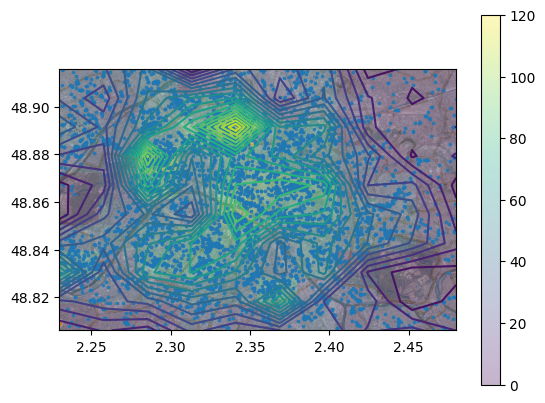

In [7]:
# Estimation de la loi de densité géographique pour le POI "bar" pour un pas de discrétisation de 10

coordonnees, notes = load_poi('bar')

H = Histogramme() # Par défaut, steps = 10
H.fit(coordonnees)
H.predict(coordonnees)
show_density(H, coordonnees, H.steps)
print(H.score(coordonnees))

In [8]:
# Vérification loi de densité avec get_density2D

# Estimation de la densité sur la grille
density_grid, xlin, ylin = get_density2D(H, coordonnees, steps=10)

# Vérification de la non-négativité de la densité
assert np.all(density_grid >= 0), "La densité ne doit pas être négative."

# Calcul de l'intégrale de la densité sur la grille
dx = xlin[1] - xlin[0]
dy = ylin[1] - ylin[0]
sum_density = np.sum(density_grid) * dx * dy

print(f"Intégrale de la densité sur la grille : {sum_density:.4f}")


Intégrale de la densité sur la grille : 1.2346


S'il n'y a pas d'erreur et si l'estimateur représente bien une loi de densité (non-négativité et intégrale égale à 1), l'intégrale de la densité estimée sur la grille doit être égale à 1. Ici, on observe une intégrale de 1.23. Ce léger dépassement peut être dû aux bords de la grille, mais étant donné que cela reste proche de 1, cela reste acceptable.

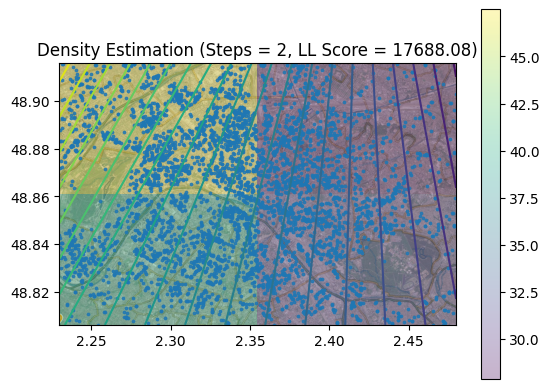

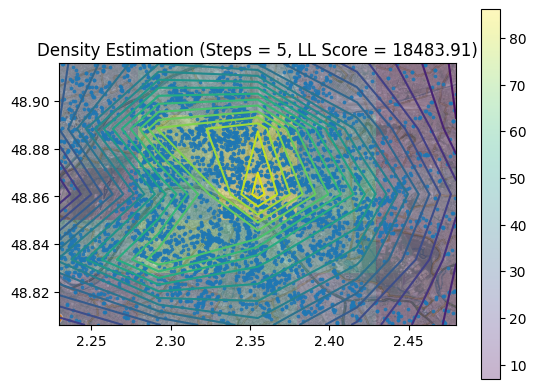

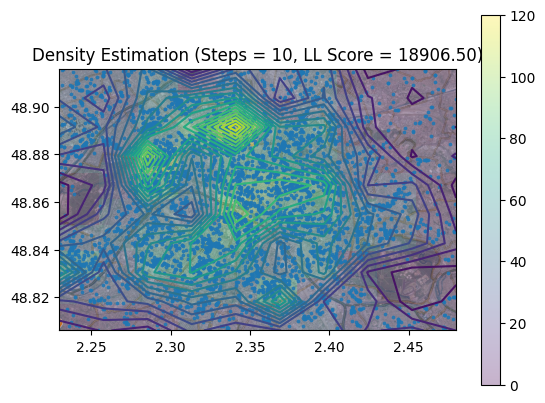

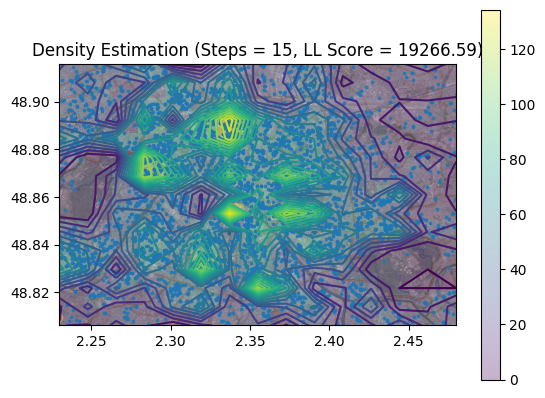

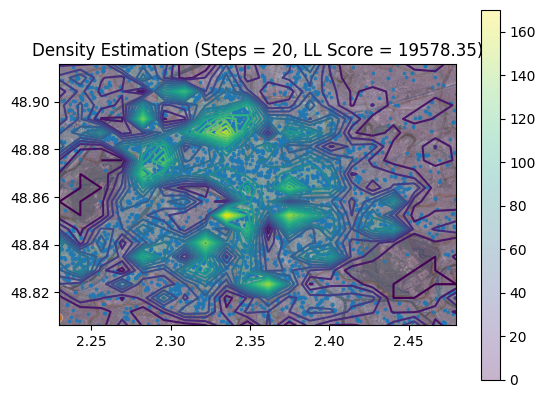

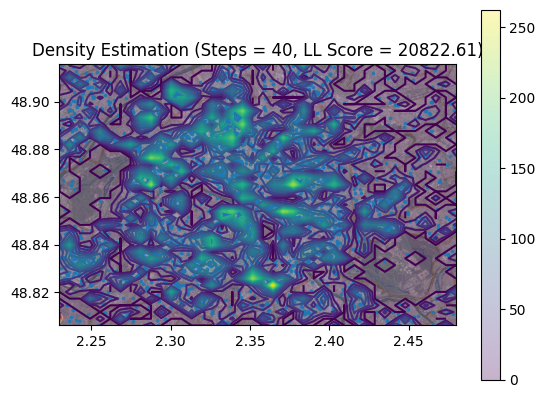

In [9]:
# Estimation de la loi de densité géographique pour le POI "bar" pour différents pas de discrétisation donnés

coordonnees, notes = load_poi('bar')

for steps in [2, 5, 10, 15, 20, 40]:
    H = Histogramme(steps)
    H.fit(coordonnees)
    H.predict(coordonnees)
    show_density(H, coordonnees, steps)
    plt.gca().set_title(f'Density Estimation (Steps = {steps}, LL Score = {H.score(coordonnees):.2f})')

On observe que plus le nombre d’intervalles de discrétisation est élevé, plus la log-vraisemblance des données d’apprentissage augmente. Cela s'explique par le fait qu’un pas plus fin permet de mieux adapter l’histogramme aux données en capturant plus de détails. Cependant, cette amélioration peut refléter un sur-apprentissage : le modèle colle trop aux données d’apprentissage et perd sa capacité de généralisation. Il est donc important de choisir un pas ni trop petit, pour éviter une approximation grossière, ni trop grand, pour éviter le sur-apprentissage. Ici, on aurait tendance à dire qu'une discrétisation moyenne, autour de 10 à 15 pas, semble être la meilleure car les scores de log-vraisemblance sont relativement similaires pour ces valeurs.

Meilleur pas de discrétisation : 13 (LL Test = 5700.33)


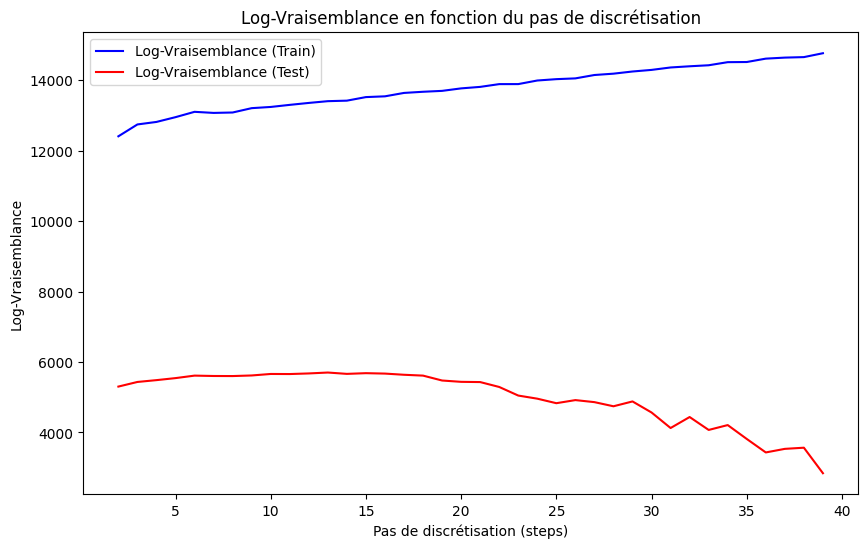

In [42]:
# Recherche du meilleur pas de discrétisation pour le POI "bar" (split en ensemble d'apprentissage et de test)

coordonnees, notes = load_poi('bar')
train_data, test_data = train_test_split(coordonnees, test_size=0.3, random_state=42)

results = []

for steps in range(2, 40):
    H = Histogramme(steps)
    H.fit(train_data)
    ll_train = H.score(train_data)
    ll_test = H.score(test_data)
    results.append((steps, ll_train, ll_test))

best = max(results, key=lambda x: x[2])
print(f"Meilleur pas de discrétisation : {best[0]} (LL Test = {best[2]:.2f})")

ll_train_values = [x[1] for x in results]
ll_test_values = [x[2] for x in results]

plt.figure(figsize=(10, 6))
plt.plot(range(2, 40), ll_train_values, label='Log-Vraisemblance (Train)', color='blue')
plt.plot(range(2, 40), ll_test_values, label='Log-Vraisemblance (Test)', color='red')
plt.xlabel('Pas de discrétisation (steps)')
plt.ylabel('Log-Vraisemblance')
plt.title('Log-Vraisemblance en fonction du pas de discrétisation')
plt.legend()
plt.show()

Meilleur pas de discrétisation : 3 (LL Test = 714.72)


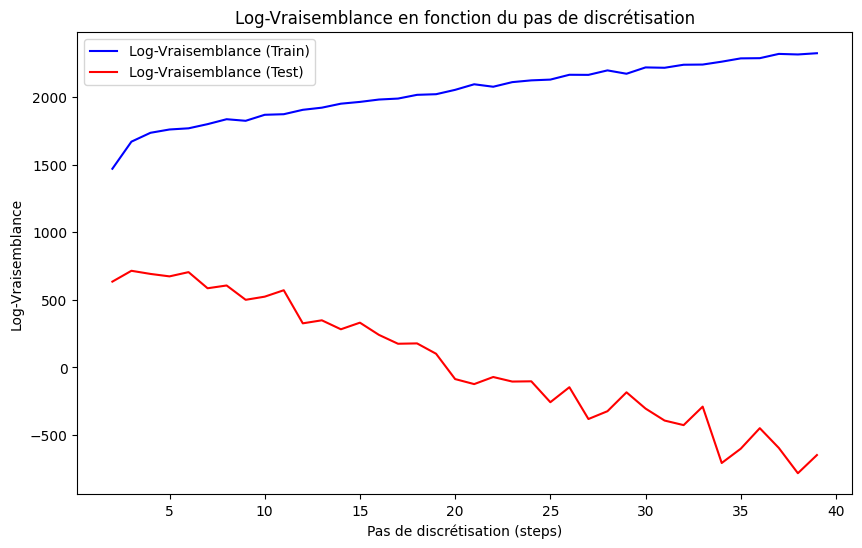

In [43]:
# Recherche du meilleur pas de discrétisation pour le POI "night_club" (split en ensemble d'apprentissage et de test)

coordonnees, notes = load_poi('night_club')
train_data, test_data = train_test_split(coordonnees, test_size=0.3, random_state=42)

results = []

for steps in range(2, 40):
    H = Histogramme(steps)
    H.fit(train_data)
    ll_train = H.score(train_data)
    ll_test = H.score(test_data)
    results.append((steps, ll_train, ll_test))

best = max(results, key=lambda x: x[2])
print(f"Meilleur pas de discrétisation : {best[0]} (LL Test = {best[2]:.2f})")

ll_train_values = [x[1] for x in results]
ll_test_values = [x[2] for x in results]

plt.figure(figsize=(10, 6))
plt.plot(range(2, 40), ll_train_values, label='Log-Vraisemblance (Train)', color='blue')
plt.plot(range(2, 40), ll_test_values, label='Log-Vraisemblance (Test)', color='red')
plt.xlabel('Pas de discrétisation (steps)')
plt.ylabel('Log-Vraisemblance')
plt.title('Log-Vraisemblance en fonction du pas de discrétisation')
plt.legend()
plt.show()

Pour le POI "bar", le meilleur pas de discrétisation est 13, c’est celui qui donne la log-vraisemblance maximale sur le test. Pour le POI "night_club" (POI plus rare), le meilleur pas de discrétisation est 3. Quand les données sont rares, un pas de discrétisation trop grand risque de créer des zones de densité nulle, ce qui fait chuter la log-vraisemblance sur le test. C’est donc logique que le meilleur pas de discrétisation pour des données rares soit plus petit que pour des données fréquentes.

## Méthode à Noyaux

### Implémentation des noyaux uniforme et gaussien

In [27]:
def kernel_uniform(X):
    """
    Calcule le noyau uniforme pour chaque donnée de X

    Parameters :
        - X : np.ndarray, matrice de données

    Returns :
        - np.ndarray : 1 si x_i dans [-1/2, 1/2], 0 sinon
    """
    return np.all(np.abs(X) <= 0.5, axis=1).astype(int)

In [28]:
def kernel_gaussian(X):
    """
    Calcule le noyau gaussien pour chaque donnée de X

    Parameters :
        - X : np.ndarray, matrice de données

    Returns :
        - np.ndarray : matrice contenant les valeurs du noyau pour chaque donnée
    """
    return (2 * np.pi) ** (-X.shape[1] / 2) * np.exp(-0.5 * np.sum(X**2, axis=1))

In [29]:
# Test des deux fonctions

X = np.array([[0.1, 0.2], [0.4, 0.5], [0.6, 0.7], [-0.3, 0.2], [0.5, -0.3], [-0.6, -0.4]])

print("Résultats du noyau uniforme : ", kernel_uniform(X))

print("Résultats du noyau gaussien : ", kernel_gaussian(X))

Résultats du noyau uniforme :  [1 1 0 1 1 0]
Résultats du noyau gaussien :  [0.15522539 0.12965515 0.10405069 0.14913892 0.13427343 0.12271667]


### Classe KernelDensity

In [33]:
class KernelDensity(Density):
    def __init__(self, kernel=None, sigma=0.1):
        Density.__init__(self)
        self.kernel = kernel
        self.sigma = sigma

    def fit(self, x):
        """
        Apprend la densité à partir des données x en utilisant le noyau spécifié.

        Parameters : 
            - x : np.ndarray, coordonnées [x, y] de chaque point de données
        """
        self.x = x

    def predict(self, data):
        """
        Retourne la densité estimée pour chaque point de données en utilisant les données d'apprentissage et le noyau.

        Parameters : 
            - data : np.ndarray, coordonnées des points

        Returns : 
            - pred : np.ndarray, densités estimées pour chaque point de données
        """
        pred = []
        for pt in data :
            density = self.kernel((np.vstack([pt]*self.x.shape[0]) - self.x)/self.sigma).sum()
            pred.append(density/(self.x.shape[0]*self.sigma**self.x.shape[1]))
        return np.array(pred)

### Tests Méthode à Noyaux

In [37]:
# Vérification loi de densité

coordonnees, notes = load_poi('bar')
K = KernelDensity(kernel=kernel_gaussian)
K.fit(coordonnees)

pred = K.predict(coordonnees)

# Vérification de la non-négativité de la densité
assert np.all(pred >= 0), "La densité ne doit pas être négative."

xmin, ymin = K.x.min(axis=0) - 3 * K.sigma
xmax, ymax = K.x.max(axis=0) + 3 * K.sigma
grid_x, grid_y = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
grid = np.vstack([grid_x.ravel(), grid_y.ravel()]).T

# Prédiction de la densité sur la grille
pred = K.predict(grid)

# Estimation de l'intégrale (approx. par somme)
dx = (xmax - xmin) / 100
dy = (ymax - ymin) / 100
integral = np.sum(pred) * dx * dy

print(f"Approximation de l'intégrale : {integral:.4f}")

Approximation de l'intégrale : 0.9794


L'intégrale est proche de 1, il s'agit donc bien d'une densité.

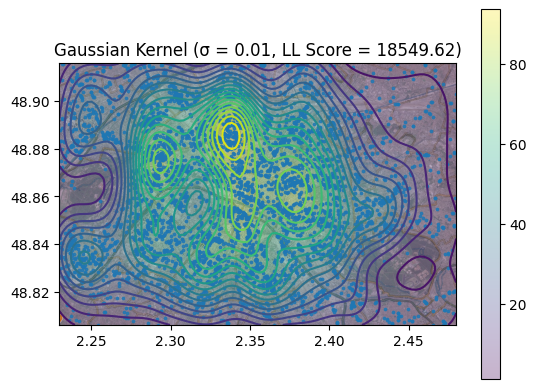

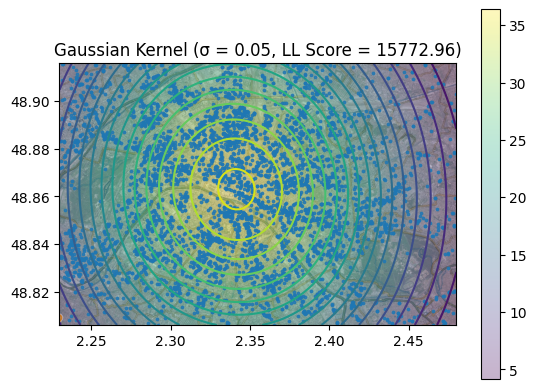

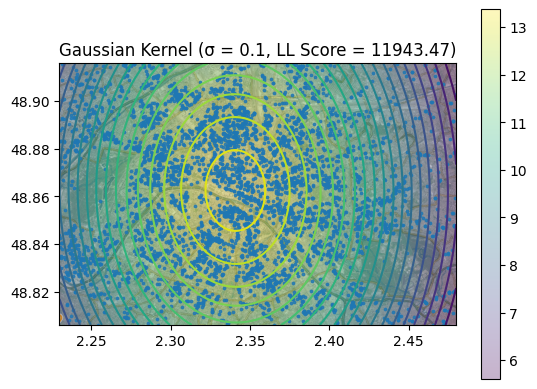

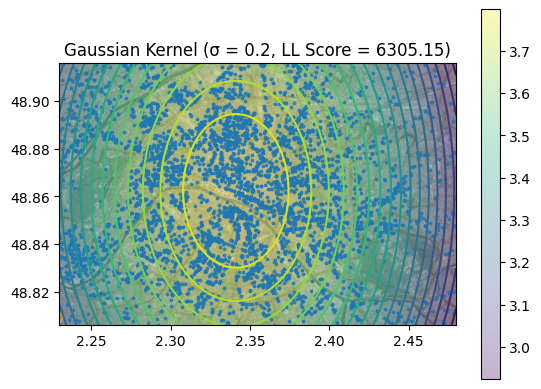

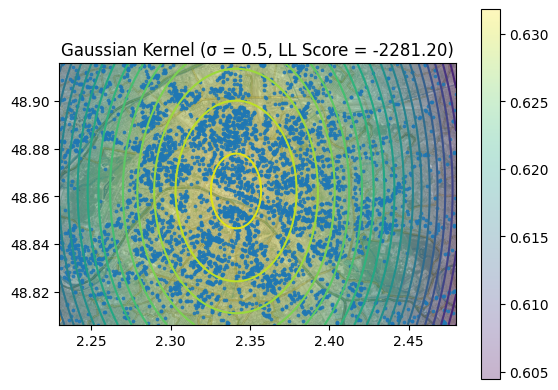

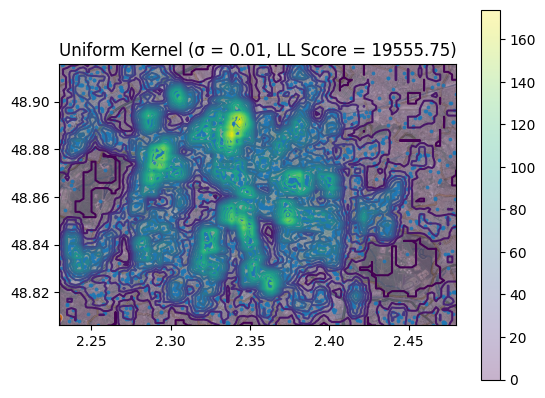

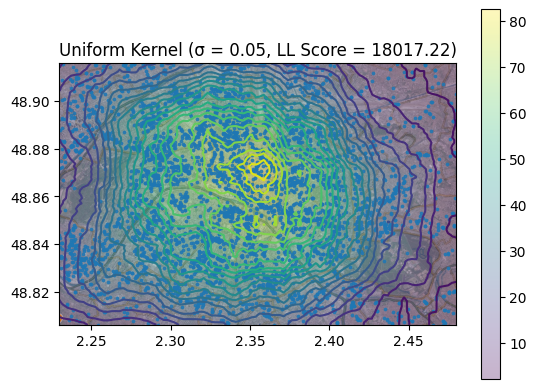

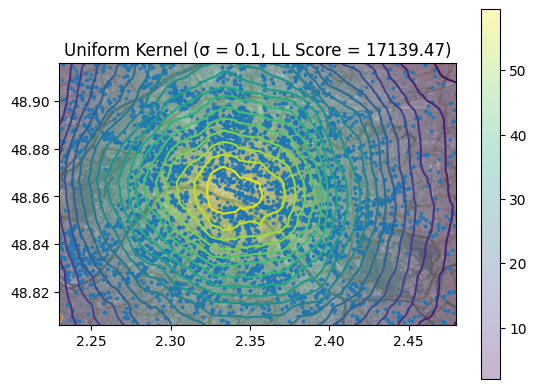

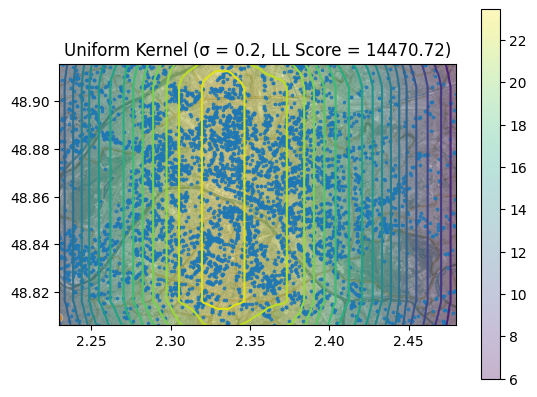

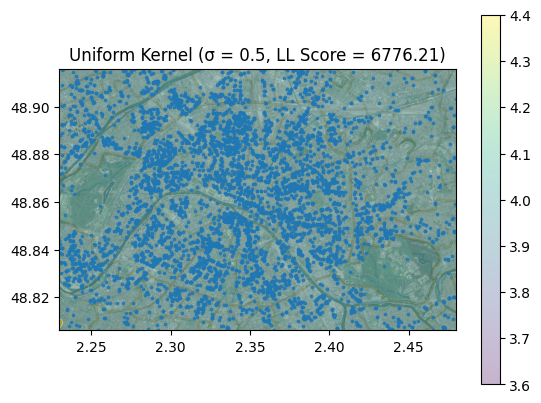

In [39]:
# Estimation de la loi de densité géographique pour le POI "bar" pour différents noyaux et hyper-paramètres

coordonnees, notes = load_poi('bar')

kernels = [("Gaussian", kernel_gaussian), ("Uniform", kernel_uniform)]

for kernel_name, kernel in kernels :
    for sigma in [0.01, 0.05, 0.1, 0.2, 0.5] :
        K = KernelDensity(kernel=kernel, sigma=sigma)
        K.fit(coordonnees)
        K.predict(coordonnees)
        show_density(K, coordonnees)
        plt.gca().set_title(f'{kernel_name} Kernel (σ = {sigma}, LL Score = {K.score(coordonnees):.2f})')

On observe que, pour les deux noyaux (uniforme et gaussien), plus sigma est élevé, plus la log-vraisemblance des données d’apprentissage diminue. Cela s'explique par le fait qu’un sigma plus grand correspond à une estimation de densité plus lissée, qui s’adapte moins précisément aux données. Il y a alors de l'underfitting, ce qui fait baisser la log-vraisemblance.

Meilleur : noyau=Uniform, sigma=0.02 (LL Test = 5630.43)


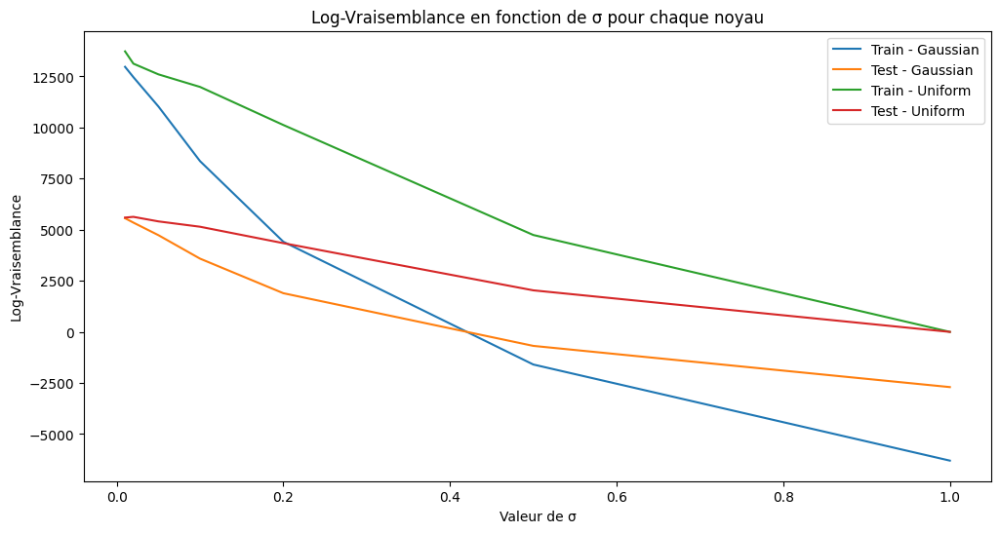

In [40]:
# Recherche des meilleurs hyper-paramètres pour le POI "bar" (split en ensemble d'apprentissage et de test)

coordonnees, notes = load_poi('bar')
train_data, test_data = train_test_split(coordonnees, test_size=0.3, random_state=42)

results = []

kernels = [("Gaussian", kernel_gaussian), ("Uniform", kernel_uniform)]
sigmas = [0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 1.0]

plt.figure(figsize=(12, 6))

for kernel_name, kernel in kernels:
    ll_train_values = []
    ll_test_values = []

    for sigma in sigmas:
        K = KernelDensity(kernel=kernel, sigma=sigma)
        K.fit(train_data)
        ll_train = K.score(train_data)
        ll_test = K.score(test_data)
        ll_train_values.append(ll_train)
        ll_test_values.append(ll_test)
        results.append((kernel_name, sigma, ll_train, ll_test))

    plt.plot(sigmas, ll_train_values, label=f'Train - {kernel_name}')
    plt.plot(sigmas, ll_test_values, label=f'Test - {kernel_name}')

best = max(results, key=lambda x: x[3])
print(f"Meilleur : noyau={best[0]}, sigma={best[1]} (LL Test = {best[3]:.2f})")

plt.xlabel('Valeur de σ')
plt.ylabel('Log-Vraisemblance')
plt.title('Log-Vraisemblance en fonction de σ pour chaque noyau')
plt.legend()
plt.show()

Meilleur : noyau=Gaussian, sigma=0.01 (LL Test = 757.96)


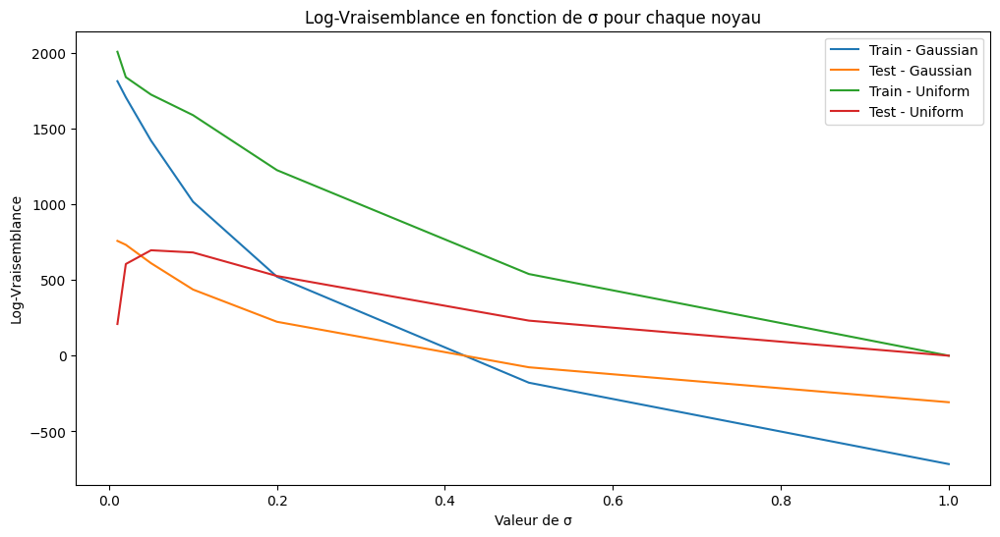

In [41]:
# Recherche des meilleurs hyper-paramètres pour le POI "night_club" (split en ensemble d'apprentissage et de test)

coordonnees, notes = load_poi('night_club')
train_data, test_data = train_test_split(coordonnees, test_size=0.3, random_state=42)

results = []

kernels = [("Gaussian", kernel_gaussian), ("Uniform", kernel_uniform)]
sigmas = [0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 1.0]

plt.figure(figsize=(12, 6))

for kernel_name, kernel in kernels:
    ll_train_values = []
    ll_test_values = []

    for sigma in sigmas:
        K = KernelDensity(kernel=kernel, sigma=sigma)
        K.fit(train_data)
        ll_train = K.score(train_data)
        ll_test = K.score(test_data)
        ll_train_values.append(ll_train)
        ll_test_values.append(ll_test)
        results.append((kernel_name, sigma, ll_train, ll_test))

    plt.plot(sigmas, ll_train_values, label=f'Train - {kernel_name}')
    plt.plot(sigmas, ll_test_values, label=f'Test - {kernel_name}')

best = max(results, key=lambda x: x[3])
print(f"Meilleur : noyau={best[0]}, sigma={best[1]} (LL Test = {best[3]:.2f})")

plt.xlabel('Valeur de σ')
plt.ylabel('Log-Vraisemblance')
plt.title('Log-Vraisemblance en fonction de σ pour chaque noyau')
plt.legend()
plt.show()

Comme pour la méthode par histogramme, les hyperparamètres optimaux dépendent de la quantité de données présentes.

##  Régression par Nadaraya-Watson

### Classe Nadaraya

In [53]:
class Nadaraya:
    def __init__(self, kernel, sigma=0.1):
        self.kernel = kernel
        self.sigma = sigma

    def fit(self, x, y):
        """
        Apprend l’estimateur sur les données

        Parameters:
            - x : np.ndarray, coordonnées [x, y] de chaque point de données
            - y : np.ndarray, notes de chaque point de données
        """
        self.x = x
        self.y = y

    def predict(self, data):
        """
        Prédit la note pour chaque point de données.

        Parameters:
            - data : np.ndarray, coordonnées [x, y] de chaque point de données

        Returns:
            - pred : np.ndarray, notes prédites
        """
        pred = []
        for pt in data :
            num = np.sum(self.kernel((pt - self.x)/self.sigma) * self.y)
            denom = np.sum(self.kernel((pt - self.x)/self.sigma))
            pred.append(num / denom if denom != 0 else 0)
        return np.array(pred)

### Tests Régression par Nadaraya-Watson

In [54]:
# Prédiction de la note du POI "bar" en fonction de son emplacement

coordonnees, notes = load_poi('bar')
train_data_x, test_data_x, train_data_y, test_data_y = train_test_split(coordonnees, notes, test_size=0.3, random_state=42)

kernels = [("Gaussian", kernel_gaussian), ("Uniform", kernel_uniform)]
sigmas = [0.01, 0.05, 0.1, 0.2, 0.5]

for kernel_name, kernel in kernels :
    for sigma in sigmas :
        N = Nadaraya(kernel=kernel, sigma=sigma)
        N.fit(train_data_x, train_data_y)
        pred = N.predict(test_data_x)
        mse = np.mean((pred - test_data_y) ** 2)
        print(f"Kernel: {kernel_name} σ = {sigma:.2f} --> MSE = {mse:.4f} Prediction: {pred}")

Kernel: Gaussian σ = 0.01 --> MSE = 3.6098 Prediction: [2.7509604  2.64056119 2.99347308 ... 2.72850463 2.38436244 3.69930149]
Kernel: Gaussian σ = 0.05 --> MSE = 3.7304 Prediction: [3.07282013 3.03658158 3.12712368 ... 3.17791412 2.96674621 3.26320466]
Kernel: Gaussian σ = 0.10 --> MSE = 3.7686 Prediction: [3.09428698 3.08823684 3.1515855  ... 3.11921595 3.0735838  3.14156215]
Kernel: Gaussian σ = 0.20 --> MSE = 3.7764 Prediction: [3.09105725 3.090119   3.1117039  ... 3.09655893 3.08742258 3.10234715]
Kernel: Gaussian σ = 0.50 --> MSE = 3.7781 Prediction: [3.08899518 3.08887664 3.09260847 ... 3.08983444 3.08850094 3.09077257]
Kernel: Uniform σ = 0.01 --> MSE = 3.9155 Prediction: [2.57714286 2.61428571 3.02727273 ... 2.65333333 1.65384615 4.00666667]
Kernel: Uniform σ = 0.05 --> MSE = 3.6323 Prediction: [2.96993318 2.65709677 2.99030303 ... 3.11314985 2.67037037 3.6003268 ]
Kernel: Uniform σ = 0.10 --> MSE = 3.7083 Prediction: [2.95993355 2.94891407 2.99243542 ... 3.25226891 2.81      

On observe que la MSE reste globalement entre 3.6 et 3.9, quelle que soit la combinaison de noyau et de paramètre σ. La MSE minimale pour le noyau gaussien est obtenue avec σ = 0.01, et pour le noyau uniforme avec σ = 0.05. Pour cet ensemble de données, ce sont donc ces valeurs de σ qui permettent le meilleur compromis entre biais et variance.